In [4]:
library(dplyr)
library(ggplot2)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



In [64]:
system("find $ws/ -type f \\( -iname \\*.ipynb -o -iname \\*.R \\) -print | xargs ls -loT > r_files.txt")
# find $ws/ -type f \( -iname \*.ipynb -o -iname \*.R \) -ls > test.txt simpler but less control of output

In [1]:
r_files_df <- readr::read_delim('./r_files.txt', delim = ' ', col_names = F)

Parsed with column specification:
cols(
  X1 = col_character(),
  X2 = col_integer(),
  X3 = col_character(),
  X4 = col_character(),
  X5 = col_character(),
  X6 = col_character(),
  X7 = col_character(),
  X8 = col_integer(),
  X9 = col_character(),
  X10 = col_character(),
  X11 = col_character(),
  X12 = col_character(),
  X13 = col_character(),
  X14 = col_character(),
  X15 = col_character(),
  X16 = col_character(),
  X17 = col_character()
)
Warning message:
“423 parsing failures.
row col   expected     actual
  2  -- 17 columns 16 columns
  3  -- 17 columns 14 columns
  4  -- 17 columns 14 columns
  5  -- 17 columns 15 columns
  6  -- 17 columns 14 columns
... ... .......... ..........
See problems(...) for more details.
”

In [3]:
r_files_df %>% head()

X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17
-rw-r--r--,NA,1,seth,NA,NA,NA,NA,NA,NA,NA,72,Oct,24,21:29:38,2016,/Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb
-rw-r--r--,NA,1,seth,NA,NA,NA,NA,NA,NA,321,Jan,21,11:54:04,2017,/Users/seth/workspace//JaneDataScienceR/R/JaneDataScienceR.R,NA
-rw-r--r--@,1,seth,NA,NA,NA,NA,NA,1677,Jan,29,14:05:29,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_alerts.R,NA,NA,NA
-rw-r--r--@,1,seth,NA,NA,NA,NA,14580,Feb,NA,7,15:54:38,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_catalog.R,NA,NA,NA
-rw-r--r--@,1,seth,NA,NA,NA,NA,NA,4263,Feb,NA,2,11:13:59,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_redis.R,NA,NA
-rw-r--r--@,1,seth,NA,NA,NA,NA,NA,4348,Jan,29,14:03:21,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_redshift.R,NA,NA,NA


In [5]:
r_file_lines<- readr::read_lines('./r_files.txt')

In [6]:
r_file_lines %>% head()

[1] "-rw-r--r--  1 seth        72 Oct 24 21:29:38 2016 /Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb"
[2] "-rw-r--r--  1 seth       321 Jan 21 11:54:04 2017 /Users/seth/workspace//JaneDataScienceR/R/JaneDataScienceR.R"       
[3] "-rw-r--r--@ 1 seth      1677 Jan 29 14:05:29 2017 /Users/seth/workspace//JaneDataScienceR/R/jane_alerts.R"            
[4] "-rw-r--r--@ 1 seth     14580 Feb  7 15:54:38 2017 /Users/seth/workspace//JaneDataScienceR/R/jane_catalog.R"           
[5] "-rw-r--r--@ 1 seth      4263 Feb  2 11:13:59 2017 /Users/seth/workspace//JaneDataScienceR/R/jane_redis.R"             
[6] "-rw-r--r--@ 1 seth      4348 Jan 29 14:03:21 2017 /Users/seth/workspace//JaneDataScienceR/R/jane_redshift.R"

In [7]:
r_file_lines %>% as.data.frame() %>% head()

.
-rw-r--r-- 1 seth 72 Oct 24 21:29:38 2016 /Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb
-rw-r--r-- 1 seth 321 Jan 21 11:54:04 2017 /Users/seth/workspace//JaneDataScienceR/R/JaneDataScienceR.R
-rw-r--r--@ 1 seth 1677 Jan 29 14:05:29 2017 /Users/seth/workspace//JaneDataScienceR/R/jane_alerts.R
-rw-r--r--@ 1 seth 14580 Feb 7 15:54:38 2017 /Users/seth/workspace//JaneDataScienceR/R/jane_catalog.R
-rw-r--r--@ 1 seth 4263 Feb 2 11:13:59 2017 /Users/seth/workspace//JaneDataScienceR/R/jane_redis.R
-rw-r--r--@ 1 seth 4348 Jan 29 14:03:21 2017 /Users/seth/workspace//JaneDataScienceR/R/jane_redshift.R


In [8]:
r_file_df <- r_file_lines %>% 
as.data.frame() %>% 
tidyr::separate(col = '.', 
                into = c('permissions', 
                         'num_links',
                         'owner',
                         'file_size',
                        'month_modified',
                        'month_day_modified',
                        'time_modified',
                         'year_modified',
                         'pathname'
                        ),
                sep="[:space:]+",
                fill='right') %>% 
head(368) # remove bad files at end

Warning message:
“Too many values at 2 locations: 372, 382”

In [9]:
r_file_df

permissions,num_links,owner,file_size,month_modified,month_day_modified,time_modified,year_modified,pathname
-rw-r--r--,1,seth,72,Oct,24,21:29:38,2016,/Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb
-rw-r--r--,1,seth,321,Jan,21,11:54:04,2017,/Users/seth/workspace//JaneDataScienceR/R/JaneDataScienceR.R
-rw-r--r--@,1,seth,1677,Jan,29,14:05:29,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_alerts.R
-rw-r--r--@,1,seth,14580,Feb,7,15:54:38,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_catalog.R
-rw-r--r--@,1,seth,4263,Feb,2,11:13:59,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_redis.R
-rw-r--r--@,1,seth,4348,Jan,29,14:03:21,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_redshift.R
-rw-r--r--,1,seth,3139,Jan,31,16:29:50,2017,/Users/seth/workspace//JaneDataScienceR/R/jane_variables.R
-rw-r--r--,1,seth,895,Jan,21,11:00:02,2017,/Users/seth/workspace//JaneDataScienceR/R/setup_script.R
-rw-r--r--,1,seth,339,Jan,21,11:25:52,2017,/Users/seth/workspace//JaneDataScienceR/R/zzz.R
-rw-r--r--,1,seth,1199,Oct,24,21:33:39,2016,/Users/seth/workspace//Untitled.ipynb


In [22]:
r_file_df_plus <- r_file_df %>%
# head() %>%
mutate(code=unlist(pathname %>%
purrr::map(readr::read_file)))

In [23]:
r_file_df_plus %>% head()

permissions,num_links,owner,file_size,month_modified,month_day_modified,time_modified,year_modified,pathname,code


In [24]:
r_file_df_plus2 <- r_file_df_plus %>%
tidyr::unite(full_date, month_modified, month_day_modified, year_modified, time_modified, sep=' ')

In [25]:
r_file_df_plus2 %>% head()

permissions,num_links,owner,file_size,full_date,pathname,code


In [26]:
r_file_df_plus3 <-
r_file_df_plus2 %>% 
# head() %>%
mutate(
full_date = lubridate::parse_date_time(full_date, "mdyHMS"),
    mday= lubridate::mday(full_date),
    wday= lubridate::wday(full_date),
    yday= lubridate::yday(full_date),
    hour= lubridate::hour(full_date),
    minute = lubridate::minute(full_date),
    month = lubridate::month(full_date),
    week = lubridate::week(full_date),
    year = lubridate::year(full_date)
)

In [27]:
r_file_df_plus3 %>% head()

permissions,num_links,owner,file_size,full_date,pathname,code,mday,wday,yday,hour,minute,month,week,year


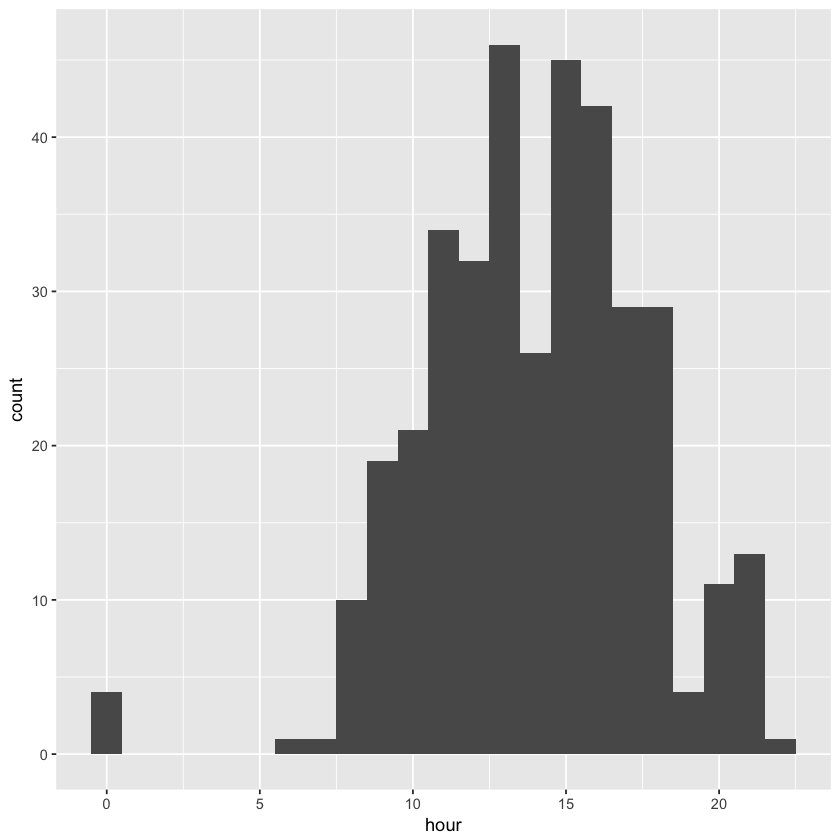

In [29]:
interval <- 'hour'
r_file_df_plus3 %>% ggplot(aes_string(x=interval)) + geom_histogram(binwidth = 1) 

In [66]:
r_file_df_plus3 %>%
select(pathname, code)%>% 
head() %>%
tidytext::unnest_tokens(word, code) %>% 
head(20)

,pathname,word
1,/Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb,cells
1.1,/Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb,metadata
1.2,/Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb,nbformat
1.3,/Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb,4
1.4,/Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb,nbformat_minor
1.5,/Users/seth/workspace//.ipynb_checkpoints/Untitled-checkpoint.ipynb,0
2,/Users/seth/workspace//JaneDataScienceR/R/JaneDataScienceR.R,janedatasciencer
2.1,/Users/seth/workspace//JaneDataScienceR/R/JaneDataScienceR.R,a
2.2,/Users/seth/workspace//JaneDataScienceR/R/JaneDataScienceR.R,package
2.3,/Users/seth/workspace//JaneDataScienceR/R/JaneDataScienceR.R,to


In [74]:
r_file_df_plus3 %>%
head(100) %>%
select(pathname, code)%>% 
tidytext::unnest_tokens(word, code) %>%
dplyr::count(word, sort=T) %>%
head(30)

word,n
n,119296
1,21192
td,16252
u001b,10617
0m,5444
false,5010
tr,4953
jane.com,3672
https,3659
th,3426


In [70]:
r_file_df_plus3 %>%
head(100) %>%
select(pathname, code)%>% 
tidytext::unnest_tokens(word, code) %>%
dplyr::count(word, sort=T) %>%
filter(word=='mutate')


word,n
mutate,81


In [86]:
r_file_df_plus3 %>%
head(10) %>%
select(pathname, code)%>% 
mutate(cut_code = gsub('[^[:alnum:]|_|-|[:space:]+]', ' ', code))

pathname,code,cut_code


In [88]:
r_file_df_plus3 %>%
# head(10) %>%
select(pathname, code)%>% 
mutate(cut_code = gsub('[^[:alnum:]|_|-|[:space:]+]', ' ', code)) %>%
tidytext::unnest_tokens(word, code) %>%
dplyr::count(word, sort=T) %>%
head(20)

word,n
n,1126186
satchmo2,983064
kiss,433862
td,232447
l,106572
1,80452
catstevens2,79838
satchmo2_8,73056
satchmo2_2,71470
t,71422
